# CapstoneProject-Critical-Contributors-for-Diabetes

### Author: Karthik Sundaram

## Executive summary
This is a Classification project aimed at identifying diabetes using 35 variables derived from demographic data and people's lifestyle survey information.



### Getting Started

<b> Importing the Required Libraries</b>



In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, accuracy_score,  precision_score, recall_score, classification_report, f1_score
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn import preprocessing
%matplotlib inline

#### Below code is needed to disable auto scrolling at every cell as we need the content of the cells to be shown in full

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

#### Common Helper Functions which will be used to filter dataframe with combinations of various features, data conversions and also for creating visualizations  

In [3]:
# Function Filter_Dataframe - Filters input dataframe based on various categorical and numeric features 
# and return the filtered dataframe and an optional second dataframe to hold the acceptance / rejection rate. 
# Filter condition takes the non tranformed input data.

def Filter_Dataframe(df,categorical_values='', numeric_values='', target_var=''):
    """ Function to take a dataframe and categorical features as filter and return two dataframes:
            1) Filtered DataFrame 
            2) Acceptance and Rejection Rates DataFrame
    Args:
        df: Transformed DataFrame where categorical features are transformed values.
        categorical_values: Filter conditions for categorical features.
        numeric_values: Filter conditions for numeric features
        target_var: Flag to calculate acceptance and/or rejection rate; Y0 for reject rate, Y1 for accept rate and Y for both
    Returns: 
        Two dataframes; one with filtered values and another with accept and/or reject rate
    """
    categories_keys = [] # holds the feature names
    category_vals = [] # holds the feature values
    multipleKeys = True  # if multiple category keys are provided. 
    NoCategoryKeys = False  # if no category keys are provided
    query = ''
    
    
    if(categorical_values != ''): # if no feature is provided as part of the filter
        if(len(categorical_values.keys()) == 1):
            item = categorical_values[list(categorical_values.keys())[0]]
            if (item == '' or item == []):
                multipleKeys = False

        for key in categorical_values.keys():
            item = categorical_values[key]
            if (item == '' or item == []):
                category_vals.extend(list(df[key].unique()))  # gets unique values within education
                item = list(df[key].unique())
                #categories_keys.extend([key] * len(category_vals)) # education * number of times
                categories_keys.extend([key] * len(list(df[key].unique()))) # education * number of times
            else:
                category_vals.append(item) # add it as list of list so dataframe won't break it into multiple rows
                #item = [orig_col_vals[key][i] for i in item if i in orig_col_vals[key]]
                item = list(df[key].unique())
                categories_keys.append(key)
            #categorical_values[key] = category_vals
            categorical_values[key] = item
        category_vals = extractSubList(category_vals)
        query = [f"{col} in {val}" for col, val in categorical_values.items()]
        query = ' & '.join(query)
        #print(query)
            
    else:
        categories_keys.append('')
        category_vals.append('')
        multipleKeys = False
        NoCategoryKeys = True
        
    #Form the query based on all the input conditions from categorical and numeric features. 
        
    query2 = 'N'
    if (numeric_values != ''):
        query2 = [f"{col}{val}" for col, val in numeric_values.items()]
        query2 = ' & '.join(query2)
        if(query != ''):
            query += ' &'+ query2
        else:
            query += query2
    
    target_key = list(target_var.keys())[0]
    target_val = target_var[target_key]
    if(target_val != ''):
        query += ' & ' + target_key + '== ' + target_val
    
    if(query != ''):
        df_filtered = df.query(query)
    else:
        df_filtered = df
    df_filtered['Numeric Value'] = query2
    
    # Frame the Acceptance and Rejection rate DataFrame
    df_acc_rate = pd.DataFrame(columns=['Positive Rate','Negative Rate','Numeric Value','Feature Value','Positive Count', \
                                        'Negative Count','Category','Value(s)','Value Counts'])
    df_acc_rate['Category'] = categories_keys
    df_acc_rate['Value(s)'] = category_vals
    if(NoCategoryKeys == False):
        df_acc_rate['Value(s)'] = df_acc_rate['Value(s)'].apply(returnSubList)
    df_acc_rate['Numeric Value'] = query2
    
    rows = df.shape[0]
    
    for index, row in df_acc_rate.iterrows():
        
        if(multipleKeys == False):
             if(NoCategoryKeys == False):
                row['Feature Value'] = ','.join(row['Value(s)'])
             else:
                row['Feature Value'] = 'All Features'
        else:
            row['Feature Value'] = 'Feature <b>' + row['Category'] + '</b>' + ' - Value <b>' + ','.join(row['Value(s)']) # to show the feature value from multiple input feature
        category = row['Category']
        category_vals = row['Value(s)']
        if(NoCategoryKeys == False):
            row['Value Counts'] = df[category].unique()
            positive_row_cnt = df_filtered.query('{2} == 1 & {0} in {1} '.format(category,category_vals,target_key)).shape[0]
            negative_row_cnt = df_filtered.query('{2} == 0 & {0} in {1} '.format(category,category_vals,target_key)).shape[0]
        else:
            positive_row_cnt = df_filtered.query('{0} == 1 '.format(target_key)).shape[0]
            negative_row_cnt = df_filtered.query('{0} == 0 '.format(target_key)).shape[0]
            
        row['Negative Count'] = negative_row_cnt
        row['Negative Rate'] = round(negative_row_cnt / rows * 100,2)
        row['Positive Count'] = positive_row_cnt
        row['Positive Rate'] = round(positive_row_cnt / rows * 100,2) 
    
    return df_filtered,df_acc_rate   


def returnSubList(lst):
    if(isinstance(lst[0],list)):
        return lst[0]
    else:
        return lst  

def extractSubList(lst):
    return [[element] for element in lst]

In [4]:
# Creates a dataframe by Feature value when more than one feature against the target variable
def dfbyfeature(df,fv = ''):
    cols = df.columns[[0,1,2,3,4,5]]
    df1 = pd.DataFrame(columns=cols)
    row = df.iloc[:1]
    df1[cols[0]] = row[cols[0]]
    df1[cols[1]] = row[cols[1]]
    df1[cols[2]] = row[cols[2]]

    if(fv != ''):
        df1[cols[3]] = fv
    else:
        df1[cols[3]] = ' (&) '.join(df[cols[3]])
    df1[cols[4]] = row[cols[4]]
    df1[cols[5]] = row[cols[5]]
    return df1 

In [5]:
# Function ReturnPercentileValue returns the value and percentile associated with the value
def ReturnPercentileValue(df_input, cols,percentile, min_row_cnt_perct = 0):
    """
    Function to return the values based on the input percentile.
    Args:
        df: DataFrame - Input Dataframe
        cols - Columns to use on the dataframe
        percentile - percentile to calculate
    Returns: 
        Dataframe
    """
    df = pd.DataFrame(columns= cols)
    df['Percentile'] = percentile
    rows = df_input.shape[0]
    percentile_value = ''
    for c in cols:
        vals = []
        percentage = []
        for perct in percentile:
            percentile_value = int(np.nanpercentile(df_input[c], perct))
            perct_rows = round(df_input[df_input[c] >= percentile_value].shape[0] / rows * 100,2) # percentage of rows
            vals.append(percentile_value)
            percentage.append(perct_rows)
        df[c] = vals
        df['Perct of records'] = percentage
        df = df[df['Perct of records'] >= min_row_cnt_perct]
    df.set_index('Percentile', inplace=True)
    return df.sort_index()


In [6]:
#Function barchart - Returns plotly batchart with labels and filters:
def barchart(df,target_var='',width=1200, height=800,ascending = False,showlegend = True, showFeature=True):
    """ Function to take a dataframe and return a barchart object
    
    Args:
        df: DataFrame 
        target_var: If Y, then both Accepted Rate (Y1) and Reject Rate (Y0) are returned
                    If Y0, then only Reject Rate (Y0) is returned
                    If Y1, then only Accept Rate (Y1) is returned
    Returns: 
        plotly barchart
    """
    target_key = list(target_var.keys())[0]
    target_val = target_var[target_key]
    columns = columns=['Percentage','Feature Value', 'Numeric Value','Feature Value 2','Row Count','target val']
    
    df0 = pd.DataFrame(columns=columns)
    df1 = pd.DataFrame(columns=columns)

    df0['Percentage'] = df['Negative Rate']
    df0['Feature'] = df['Feature Value']
    df0['Feature Value'] = target_key + ' = 0 : ' + df['Feature Value']
    df0['Numerical Feature Filter'] =  df['Numeric Value']
    df0['Row Count'] =  df['Negative Count']
    df0['target val'] =  target_key + ' = 0'
    
    df1['Percentage'] = df['Positive Rate']
    df1['Feature'] = df['Feature Value']
    df1['Feature Value'] = target_key + ' = 1 : ' + df['Feature Value']
    df1['Numerical Feature Filter'] =  df['Numeric Value']
    df1['Row Count'] =  df['Positive Count']
    df1['target val'] =  target_key + ' = 1'
        
    hover_data = {'Percentage':True,'Row Count':True,'Numerical Feature Filter':True,'Feature Value':False,'target val':True}
    if(target_val == ''):
        hover_data['target val'] = False
        df = pd.concat([df1,df0])
        if(showFeature == False):
            hover_data['Feature Value'] = True
            fig = px.bar(df, x='target val', y=df.columns[0], color='target val',hover_data=hover_data,text='Row Count')
        else:
            #df.sort_values(by=['Row Count'],ascending=ascending, inplace=True)
            df.sort_values(by=['Feature','Row Count'], ascending=[ascending,ascending], inplace=True)
            #df.sort_values(by=['Row Count'],ascending=ascending, inplace=True)
            fig = px.bar(df, x='Feature Value', y=df.columns[0], color='Feature',hover_data=hover_data,text='Row Count')
    elif(target_val == '0'):
        df0 = df0.rename(columns={'Percentage': 'Negative Rate'})
        hover_data = {'Negative Rate':True,'Row Count':True,'Numerical Feature Filter':True,'Feature Value':False,'target val':True}
        df = df0
        df.sort_values(by=['Row Count'],ascending=ascending, inplace=True)
        fig = px.bar(df, x='Feature', y=df.columns[0], color='Feature', hover_data=hover_data,text='Row Count')
    elif(target_val == '1'):
        df1 = df1.rename(columns={'Percentage': 'Positive Rate'})
        hover_data = {'Positive Rate':True,'Row Count':True,'Numerical Feature Filter':True,'Feature Value':False,'target val':True}
        df = df1
        df.sort_values(by=['Row Count'],ascending=ascending, inplace=True)
        fig = px.bar(df, x='Feature', y=df.columns[0], color='Feature', hover_data=hover_data,text='Row Count')
    
    #fig.update_traces(hovertemplate = "Feature:%{label}: <br>Percentage:%{value}</br>Filters:%{custom_data}")
    #fig.update_traces(hovertemplate = "</br> Percentage:%{value} </br> Filters:%{customdata}")
    
    #print(df.head(50))
    fig.update_layout(width = width, height = height)
    #if(descending == True):
        #fig.update_xaxes(categoryorder="total descending")
        #fig.update_xaxes(categoryorder="category descending")
        
        #fig.update_layout(width=900,height=500)
    fig.update_layout(yaxis_ticksuffix="%",showlegend=showlegend)
    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
    fig.for_each_trace(lambda t: t.update(hovertemplate=t.hovertemplate.replace("sum of", "")))
    return fig

In [7]:
# Function to convert BMI to range based on CDC guidelines
def RawBmiToScale(bmi):
    scale = 0
    if(bmi >= 18.5 and bmi <=24.9):
        scale = 1
    elif(bmi < 18.5):
        scale=2
    elif(bmi >= 25 and bmi <=29.9):
        scale = 3
    elif(bmi >= 30 and bmi <=34.9):
        scale = 4
    elif(bmi >=35 and bmi <=39.9):
        scale=5
    else:
        scale=6
    return scale

In [8]:
# Function boxplot to return boxplot
def boxplot(df,y,x='', width=700,height=500):
    if (x == ''):
        fig = px.box(df, y=y, color='y', width=width, height=height)
    else:
        fig = px.box(df, y=y, x=x, color='y', width=width, height=height)
    return fig

In [9]:
# Function to convert BMI value to its description
def BmiToDesc(bmi):
    desc = ''
    if(bmi >= 18.5 and bmi <=24.9):
        desc = 'Healthy'
    elif(bmi < 18.5):
        desc='Under Weight'
    elif(bmi >= 25 and bmi <=29.9):
        desc = 'Over weight'
    elif(bmi >= 30 and bmi <=34.9):
        desc = 'Class I Obesity'
    elif(bmi >=35 and bmi <=39.9):
        desc= 'Class II Obesity'
    else:
        desc='Clas III Obesity'
    return desc

In [10]:
# Function to convert columns to specified type by ignoring the list
def ConvertType(df, type,ignorelist):
    return (df.set_index(ignorelist, append=True)
        .astype(type)
        .reset_index(ignorelist)
       )

In [11]:
# Function to convert columns given in the parameter to the specified type
def ConvertToType(df,cols,type):
    for c in cols:
        df[c] = df[c].astype(type)
    return df

In [12]:
# Function to return Age interval based on 2014 BRFSS Codebook
def AgeInterval(AgeCode):
    ageint = ''
    if(AgeCode == 1):
        ageint = '18-24'
    elif(AgeCode == 2):
        ageint = '25-29'
    elif(AgeCode == 3):
        ageint = '30-34'
    elif(AgeCode == 4):
        ageint = '35-39'
    elif(AgeCode == 5):
        ageint = '40-44'
    elif(AgeCode == 6):
        ageint = '45-49'
    elif(AgeCode == 7):
        ageint = '50-54'
    elif(AgeCode == 8):
        ageint = '55-59'
    elif(AgeCode == 9):
        ageint = '60-64'
    elif(AgeCode == 10):
        ageint = '65-69'
    elif(AgeCode == 11):
        ageint = '70-74'
    elif(AgeCode == 12):
        ageint = '75-79'
    elif(AgeCode == 13):
        ageint = '>80'
    else:
        ageint = 'Unknown'
    return ageint

In [13]:
# Function to return Income range based on 2014 BRFSS Codebook
def IncomeRange(IncomeCode):
    Income = ''
    if(IncomeCode == 1):
        Income = '< $10K'
    elif(IncomeCode == 2):
        Income = '$10-15K'
    elif(IncomeCode == 3):
        Income = '$15-20K'
    elif(IncomeCode == 4):
        Income = '$20-25K'
    elif(IncomeCode == 5):
        Income = '$25-35K'
    elif(IncomeCode == 6):
        Income = '$35-50K'
    elif(IncomeCode == 7):
        Income = '$50-75K'
    else:
        Income = '> $75K'
    
    return Income

In [14]:
# Function "return_metrics" to return accuracy, precision and recall score and f-1 score
def return_metrics(y_test, y_pred):
    """
    Function to return various metrics resulting from a classification
    Args:
        y_test: Actual target variable values from test (validation) set
        y_pred: Predicted values from test (validation set)
    Returns:
        list
    """
    
    r=[]
    r.append('%.2f' % accuracy_score(y_test,y_pred))
    r.append('%.2f' % precision_score(y_test, y_pred))
    r.append('%.2f' % recall_score(y_test, y_pred))
    r.append('%.2f' % f1_score(y_test, y_pred))
    return (r)

In [15]:
# Function "gridcv" to perform grid search to get train / test time
def gridcv(estimator, params, X1, y, cv=''):
    if(cv != ''):
        grid = GridSearchCV(estimator=estimator, param_grid=params, cv=cv)
    else:
        grid = GridSearchCV(estimator=estimator, param_grid=params)
    grid.fit(X1,y)
    return grid

In [16]:
# Function "ReturnPermutationImportance" to return feature importance of models
def ReturnPermutationImportance(model, X_test, y_test, n_repeats, modelname=''):
    perm_importance = permutation_importance(model, X_test, y_test, n_repeats=n_repeats, random_state=22,)
    sorted_idx = perm_importance.importances_mean.argsort()[-10:]
    fig = plt.figure(figsize=(12, 10))
    plt.barh(range(len(sorted_idx)), perm_importance.importances_mean[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
    plt.title('Permutation Importance of ' + modelname)
    return fig, perm_importance

In [17]:
#Declare target variables and its value
Y0 = {'y':'0'} 
Y1 = {'y':'1'}
Y = {'y':''}

In [18]:
# Declare Categorical Feature Values
Yes = ['Yes']
No = ['No']
All = ['Yes','No']

In [19]:
#Function top_correlation - Returns correlation matrix
def top_correlation (df,n,ascending):
    corr_matrix = df.corr()
    correlation = (corr_matrix.abs().where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool_))
                 .stack()
                 .sort_values(ascending=ascending))
    corr_df = pd.DataFrame(correlation).reset_index()
    corr_df.columns=["Feature 1","Feature 2","Correlation"]
    corr_df = corr_df.reindex(corr_df.Correlation.abs().sort_values(ascending=ascending).index).reset_index().drop(["index"],axis=1)
    return corr_df.head(n)

## Data Understanding 

<b>To gain a better understanding of the data, please read the information provided in the UCI link below: </b> https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators

<b>Data indicators and their meaning / ranges are explained in the codebook (.PDF file) given below: </b> https://www.cdc.gov/brfss/annual_data/2014/pdf/CODEBOOK14_LLCP.pdf

In [20]:
# Load Data, convert all columns from float to int except BMI,rename column for target variable and move it to the end
df_diabetes = pd.read_csv('data/diabetes_binary_health_indicators_BRFSS2015.csv')
df_diabetes = ConvertType(df_diabetes,int,['BMI'])
df_diabetes.rename(columns={'Diabetes_binary':'y'}, inplace=True)
df_diabetes.insert(len(df_diabetes.columns) - 1, 'y', df_diabetes.pop('y'))

In [21]:
df_diabetes.describe(include='all')

,BMI,HighBP,HighChol,CholCheck,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,y
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,28.382364,0.429001,0.424121,0.962670,0.443169,0.040571,0.094186,0.756544,0.634256,0.811420,0.056197,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875,0.139333
std,6.608694,0.494934,0.494210,0.189571,0.496761,0.197294,0.292087,0.429169,0.481639,0.391175,0.230302,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148,0.346294
min,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,24.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000,0.000000
50%,27.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000,0.000000
75%,31.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000,0.000000
max,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000,1.000000


#### No Feature variable has null/missing values


## Understanding the Features

Copying features here for easy reference.
Target variable is <b>"Diabetes_binary"</b>. It will be renamed as y down below

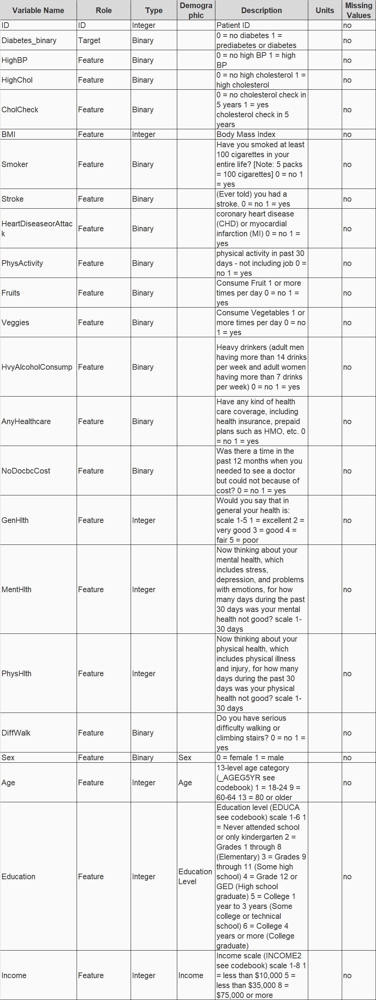

<b>Data description</b> - The dataset contains  253,680 rows with 21 independent variables and one dependent variable. The format of raw data is a .csv file. The target variable of the dataset is the column will be renamed to <b>"y"</b>.

<b>Data quality</b> - There are no missing data in any of the columns.

## Basic Feature Engineering - More feature engineering will be performed at the end.

##### Before performing EDA, we need the following feature engineering to be performed. 
<b> a) Convert numerical data types to categorical data type </b> <br>
<b> b) Convert BMI as a range as per the CDC guidelines. </b> <br>

Under 18.5: Underweight<br>
18.5–24.9: Healthy range<br>
25–29.9: Overweight<br>
30–34.9: Class I obesity<br>
35–39.9: Class II obesity<br>
40 or over: Class III obesity, also known as severe, extreme, or massive obesity<br>

In [22]:
#convert BMI to scale as raw BMI value cannot be used as it is.
df_diabetes['BMIRange'] = df_diabetes['BMI'].apply(RawBmiToScale)

In [23]:
# Convert 0 to No and 1 to Yes for categorical columns
ignorelist = ['Sex','BMIRange','BMI','GenHlth','MentHlth','PhysHlth','Age','Education','Income','y']
df_diabetes = df_diabetes.set_index(ignorelist, append=True).apply(lambda x: x.map({0:'No',1:'Yes'})).reset_index(ignorelist)

In [24]:
# Change Sex from 0 to F and 1 to M
df_diabetes['Sex'] = df_diabetes['Sex'].map({0:'F',1:'M'})

In [25]:
# Move the target variable to the end
df_diabetes.insert(len(df_diabetes.columns) - 1, 'y', df_diabetes.pop('y'))

In [26]:
df_diabetes.head(2)

,Sex,BMIRange,BMI,GenHlth,MentHlth,PhysHlth,Age,Education,Income,HighBP,HighChol,CholCheck,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,DiffWalk,y
0,F,6,40.0,5,18,15,9,4,3,Yes,Yes,Yes,Yes,No,No,No,No,Yes,No,Yes,No,Yes,0
1,F,3,25.0,3,0,0,7,6,1,No,No,No,Yes,No,No,Yes,No,No,No,No,Yes,No,0


# Exploratory Data Analysis

###### For EDA purpose, use the back up dataframe as we will add additional features for EDA purpose which will not be used as part of classification.

In [27]:
# Back up
df_diabetes_bk = df_diabetes.copy()

### Target Value Distribution

In [28]:
barchart(Filter_Dataframe(df_diabetes_bk,'','',Y)[1],Y, width=800, height=600)

Target variable has <br>
a) <b>86.07 %</b> of class <b>no</b> and <br>
b) <b>13.93 %</b> of class <b>yes</b>. <br>
There is an <b> imbalance </b> with this dataset.

<b> Features "High BP" and "High Cholesterol" to understand its impact on being diabetic </b>

In [29]:
# New feature where both chlosterol and BP are high
df_diabetes_bk['HighBPChol'] = df_diabetes_bk.apply(lambda x: 'Yes' if x['HighBP'] == 'Yes' and x['HighChol'] == 'Yes' else 'No', axis=1) 

In [30]:
barchart(Filter_Dataframe(df_diabetes_bk,{'HighBP':[],'HighChol':[],'HighBPChol':[],'Sex':[]},'',Y)[1],Y,width=1000,height=600, ascending=False)

Based on the above features, only a small percentage of having either of these conditions or both contribute to diabetes.<br>
<b> a) </b> Feature <b>High BP</b> - <b> 10.49 % </b> of patients had High BP and Diabetes. <br>
<b> b) </b> Feature <b>High cholesterol</b> - <b> 9.34 % </b> of patients had High cholesterol and Diabetes. <br>
<b> c) </b> Feature <b>High BP and cholesterol</b> - <b> 7.57 % </b> of patients had High BP and High cholesterol and have Diabetes.

##### Feature BMI

In [31]:
# Get BMI description based on CDC for a clear visualiztion
df_diabetes_bk['BmiDesc'] = df_diabetes.BMI.apply(BmiToDesc)

In [32]:
barchart(Filter_Dataframe(df_diabetes_bk,{'BmiDesc':[]},'',Y)[1],Y,width=950,height=600, ascending=False)

<b>BMI</b> alone is not a good predictor for diabetes as <b> 84.9%</b> percentage fall under <b>non diabetic</b> category but having BMI not in <b>optimal</b> range.

Features <b>Smoker</b> and <b>HvyAlcoholConsump</b>

In [33]:
barchart(Filter_Dataframe(df_diabetes_bk,{'Smoker':[],'HvyAlcoholConsump':[]},'',Y)[1],Y,width=1000,height=600, ascending=False)

No big difference in diabetic rates with being a <b>"smoker"</b> as being a smoker and diabetic is <b> 7.22% </b> where being a non smoker and diabetic is <b>6.71 %</b>. We can remove this feature later if needed. Not for now.

<b>Feature Age</b>

In [34]:
# Add a new feature to show the age interval
df_diabetes_bk['AgeInt'] = df_diabetes_bk['Age'].apply(AgeInterval)

In [35]:
barchart(Filter_Dataframe(df_diabetes_bk,{'AgeInt':[]},'',Y1)[1],Y1,width=1000,height=600, ascending=True)

Diabetic rate increases with <b>Age</b>

Features <b>CholCheck</b>,<b>AnyHealthcare</b> and <b>DiffWalk</b>

In [36]:
barchart(Filter_Dataframe(df_diabetes_bk,{'AnyHealthcare':[],'CholCheck':[],'DiffWalk':[],'HighChol':[]},'',Y)[1],Y,width=1000,height=600, ascending=False)

Feature <b>AnyHealthcare</b> <I>(have any kind of health care coverage)</I> has <b>95.1%</b> as Yes and feature <b>CholCheck</b><I> (cholesterol check in 5 years)</I> has <b>96.27%</b> of records as Yes. Both these features can be removed as they both have Near Zero Variance.

<b>Feature Income</b>

In [37]:
# Add a new feature to show the income range
df_diabetes_bk['IncomeRnge'] = df_diabetes_bk['Income'].apply(IncomeRange)

In [38]:
barchart(Filter_Dataframe(df_diabetes_bk,{'IncomeRnge':[]},'',Y)[1],Y,width=1000,height=600, ascending=False)

There is a pattern with <b>decreased</b> instance of diabetes with <b>increased</b> income. However this dataset is imbalanced and outliers need to be identified later.

#### Plots for Numerical Features

There are <b>two numerical features</b> in the dataset. <br>
a) <b>MentHlth</b> -- How many days during the past 30 days was your mental health not good. <br>
b) <b>PhysHlth</b> -- How many days during the past 30 days was your physical health not good.

In [39]:
# Mental Health (MentHlth)
boxplot(df_diabetes_bk,x='y', y='MentHlth')

In [41]:
# Physical Health (PhysHlth)
boxplot(df_diabetes_bk,x='y', y='PhysHlth')

### There are no outliers in the numerical features

## Features Engineering.. Continued

In [42]:
# Drop columns AnyHealthcare and CholCheck as they provide minimal value.
# Drop column BMI as we have created a new feature called BMIRange from BMI
df_diabetes.drop(columns=['AnyHealthcare','CholCheck','BMI'], axis=1, inplace=True)

<b>Top 5 Correlating Features</b>

In [43]:
top_correlation(df=df_diabetes.drop(columns='y',axis=1),n=5, ascending=True)

,Feature 1,Feature 2,Correlation
0,BMIRange,Age,0.015002
1,BMIRange,MentHlth,0.077192
2,MentHlth,Age,0.092068
3,BMIRange,Income,0.095877
4,PhysHlth,Age,0.099130


<b>Heatmap of correlation matrix</b>

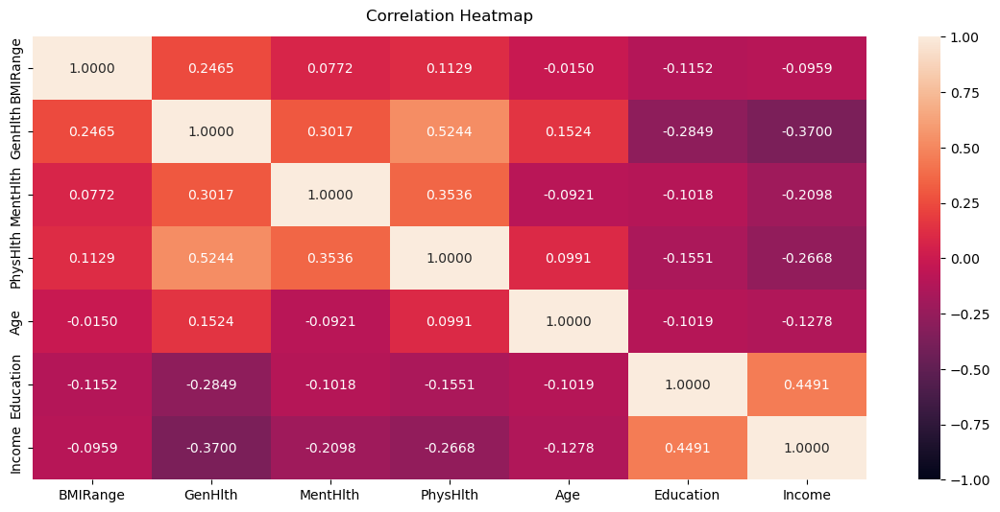

In [44]:
plt.figure(figsize=(14, 6))
heatmap = sns.heatmap(df_diabetes.drop(columns='y',axis=1).corr(), vmin=-1, vmax=1, annot=True, fmt='.4f') #round to 3 decimal places
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

In [45]:
# Convert Age, Education and Income as categorical types
df_diabetes = ConvertToType(df_diabetes, ['Age','Education','Income'], object)

##### Ordinal Features

<b>BMI range</b> and <b>General health</b> are ordinal features. <br>
Raw BMI has been converted to the range based on the description from CDC and general health has been given as ordinal data from good to bad.

<b>General Health</b> - Scale 1-5 <br>
<b>1</b> = excellent <b>2</b> = very good <b>3</b> = good <b>4</b> = fair <b>5</b> = poor.

<b>BMI Scale</b>
Under 18.5: Underweight <br>
18.5–24.9: Healthy range<br>
25–29.9: Overweight<br>
30–34.9: Class I obesity<br>
35–39.9: Class II obesity<br>
40 or over: Class III obesity, also known as severe, extreme, or massive obesity<br>

<b>BMI Scale</b> - Scale 1-6 <br>
<b>1</b> = excellent <b>2</b> = average <b>3</b> = OK <b>4</b> = poor <b>5</b> = very poor <b>6</b> - extremely poor.

In [46]:
#BMI range from best to worst
ordinal_BMI=[1,2,3,4,5,6]

#General health from best to worst
ordinal_genhlth = [1,2,3,4,5]

# Numerical features
num_cols = ['MentHlth','PhysHlth']

# Ordinal features
ordinal_features = ['BMIRange','GenHlth']

# Categorical columns
catcols = df_diabetes.select_dtypes(include=['object']).columns.tolist()

 ### Column Transformation using 
 ##### a) Oridinal Encounter 
 ##### b) One Hot Encounter 
 ##### c) Standard Scaler

In [47]:
column_transformer = ColumnTransformer(transformers= [
    ('ordinal_encoder', OrdinalEncoder(categories = [ordinal_BMI,ordinal_genhlth]),ordinal_features),
    ('one_hot_encoder', OneHotEncoder(drop='if_binary', sparse = False), catcols),
    ('standard_scaler', StandardScaler(),num_cols),
], remainder='passthrough')

In [48]:
X = column_transformer.fit_transform(df_diabetes.drop('y', axis=1))
y = df_diabetes[['y']]

In [49]:
lstNewFeatures = list(column_transformer.get_feature_names_out())
lstNewFeatures = [sub.split('__')[1] for sub in lstNewFeatures]

In [50]:
X1 = pd.DataFrame(data=X, columns=lstNewFeatures)

In [51]:
X1.head(2)

,BMIRange,GenHlth,Sex_M,Age_1,Age_2,Age_3,Age_4,Age_5,Age_6,Age_7,Age_8,Age_9,Age_10,Age_11,Age_12,Age_13,Education_1,Education_2,Education_3,Education_4,Education_5,Education_6,Income_1,Income_2,Income_3,Income_4,Income_5,Income_6,Income_7,Income_8,HighBP_Yes,HighChol_Yes,Smoker_Yes,Stroke_Yes,HeartDiseaseorAttack_Yes,PhysActivity_Yes,Fruits_Yes,Veggies_Yes,HvyAlcoholConsump_Yes,NoDocbcCost_Yes,DiffWalk_Yes,MentHlth,PhysHlth
0,5.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.998592,1.233999
1,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,-0.429630,-0.486592


### Train/Test Split

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.3, random_state=42)

In [53]:
# Metrics Dataframe to be appended with metrics from various classifiers
metrics_df = pd.DataFrame(index=['Accuracy', 'Precision', 'Recall', 'f1-score(2*(P*R)/(P+R))'])

### A Baseline Model
Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

In [54]:
#create a dummy classifier to create a simple baseline to compare against other more complex classifiers.
dummy_clf = DummyClassifier(strategy='stratified', random_state=42)

In [55]:
# fit the dummy classifier
dummy_clf.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='stratified')

In [56]:
y_pred = dummy_clf.predict(X_test)

In [57]:
dummy_classifier_metrics = return_metrics(y_test, y_pred)

In [58]:
metrics_df['Dummy'] = dummy_classifier_metrics

### Multiple Models

Create a <b>simple Logistic Regression, KNN, Decision Tree and SVM model</b> and compare against the baseline model

##### Logistic Regression with default parameters

In [59]:
logreg = LogisticRegression().fit(X_train, y_train)

In [60]:
y_pred = logreg.predict(X_test)

In [61]:
Logreg_classifier_metrics = return_metrics(y_test, y_pred)

In [62]:
metrics_df['Logreg'] = Logreg_classifier_metrics

#### K-Nearest Neighbors with default parameters

In [63]:
knn = KNeighborsClassifier().fit(X_train.values, y_train.values)

In [64]:
y_pred = knn.predict(X_test.values)

In [65]:
KNN_classifier_metrics = return_metrics(y_test, y_pred)

In [66]:
metrics_df['KNN'] = KNN_classifier_metrics

#### Decision Tree with default parameters

In [67]:
dt = DecisionTreeClassifier().fit(X_train, y_train)

In [68]:
y_pred = dt.predict(X_test)

In [69]:
dt_classifier_metrics = return_metrics(y_test, y_pred)

In [70]:
metrics_df['DT'] = dt_classifier_metrics

#### SVM with default parameters

In [71]:
svm = LinearSVC().fit(X_train,y_train)

In [72]:
y_pred = svm.predict(X_test)

In [73]:
svm_classifier_metrics = return_metrics(y_test, y_pred)

In [74]:
metrics_df['SVM'] = svm_classifier_metrics

In [75]:
metrics_df

,Dummy,Logreg,KNN,DT,SVM
Accuracy,0.76,0.87,0.85,0.80,0.87
Precision,0.14,0.56,0.40,0.30,0.62
Recall,0.14,0.17,0.20,0.31,0.08
f1-score(2*(P*R)/(P+R)),0.14,0.26,0.26,0.30,0.14


<b>Accuracy, Precision and Recall Scores </b> all improved with <b>non dummy model</b>. We will further improve the performance of these models using various hyper parameters. Before that, we also have to look at removing outliers on numeric features.

### Improving Models

Adding <b>various hyper parameters to the model</b> and <b>checking the scores</b>.

In [76]:
# create a dataframe for improved models
imp_models = pd.DataFrame(columns=['model'])
imp_models['model'] = ['Logistic Reg','KNN','Decision Tree','SVM']

In [77]:
# param_grid for Logistic Reg
param_lg = {'penalty':['l2','none'],'solver':['lbfgs','sag'], 'max_iter':[100,200],'C':[1,2.5]}

In [78]:
#param_grid for knn
k_range = list(range(1, 10))
param_grid_knn = {'n_neighbors':k_range}

In [79]:
# param_grid for Decision Tree
max_depth = [3,4,5,6,7]
criteria = ['gini','entropy']
splitter = ["best", "random"]
param_grid_dt = {'max_depth':max_depth, 'criterion':criteria, 'splitter':splitter}

In [80]:
#svm
#param_grid_svc = {'kernel': ['rbf'],'C': [0.1, 1],  
 #             'gamma': [1, 0.1]}
# param_grid for Linear SVM
param_grid_svc =  {'C': [0.1, 1, 10],
                  'penalty': ['l1','l2'],
                  'max_iter': [1000,2000,5000]}

##### Perform Gridsearch with various hyper parameters

In [81]:
#Logistic Regression
grid_lg = gridcv(estimator=LogisticRegression(), params=param_lg, X1=X_train, y=y_train)

In [82]:
#KNN
grid_knn = gridcv(estimator=KNeighborsClassifier(), params=param_grid_knn, X1=X_train, y=y_train)

In [83]:
#Decision Tree
grid_DT = gridcv(estimator=DecisionTreeClassifier(), params=param_grid_dt, X1=X_train, y=y_train)

In [ ]:
#SVM
grid_svm = gridcv(estimator=LinearSVC(), params=param_grid_svc, X1=X_train, y=y_train)

###### SVM GridSearch takes more than 9 hours and not completing. So ignoring it for now.

In [84]:
# improved models
lg_model = grid_lg.best_estimator_
#svm_model = grid_svm.best_estimator_
svm_model = svm 
knn_model = grid_knn.best_estimator_
tree_model = grid_DT.best_estimator_

##### Metrics from improved models. Lets name improved models with suffix "_imp".

In [85]:
#Improved Logistic Regression metrics
y_pred = lg_model.predict(X_test)
imp_logreg_classifier_metrics = return_metrics(y_test, y_pred)
metrics_df['Logreg_Imp'] = imp_logreg_classifier_metrics

In [86]:
#Improved KNN metrics
y_pred = knn_model.predict(X_test.values)
imp_knn_classifier_metrics = return_metrics(y_test, y_pred)
metrics_df['KNN_Imp'] = imp_knn_classifier_metrics

In [87]:
#Improved Decision Tree metrics
y_pred = tree_model.predict(X_test)
imp_dt_classifier_metrics = return_metrics(y_test, y_pred)
metrics_df['DT_Imp'] = imp_dt_classifier_metrics

In [88]:
#Improved SVM metrics
y_pred = svm_model.predict(X_test)
imp_svm_classifier_metrics = return_metrics(y_test, y_pred)
metrics_df['SVM_Imp'] = imp_svm_classifier_metrics

In [89]:
metrics_df

,Dummy,Logreg,KNN,DT,SVM,Logreg_Imp,KNN_Imp,DT_Imp,SVM_Imp
Accuracy,0.76,0.87,0.85,0.80,0.87,0.87,0.81,0.87,0.87
Precision,0.14,0.56,0.40,0.30,0.62,0.56,0.30,0.57,0.62
Recall,0.14,0.17,0.20,0.31,0.08,0.17,0.30,0.12,0.08
f1-score(2*(P*R)/(P+R)),0.14,0.26,0.26,0.30,0.14,0.26,0.30,0.19,0.14


# Most important features

#### Performing permutation importance on all models

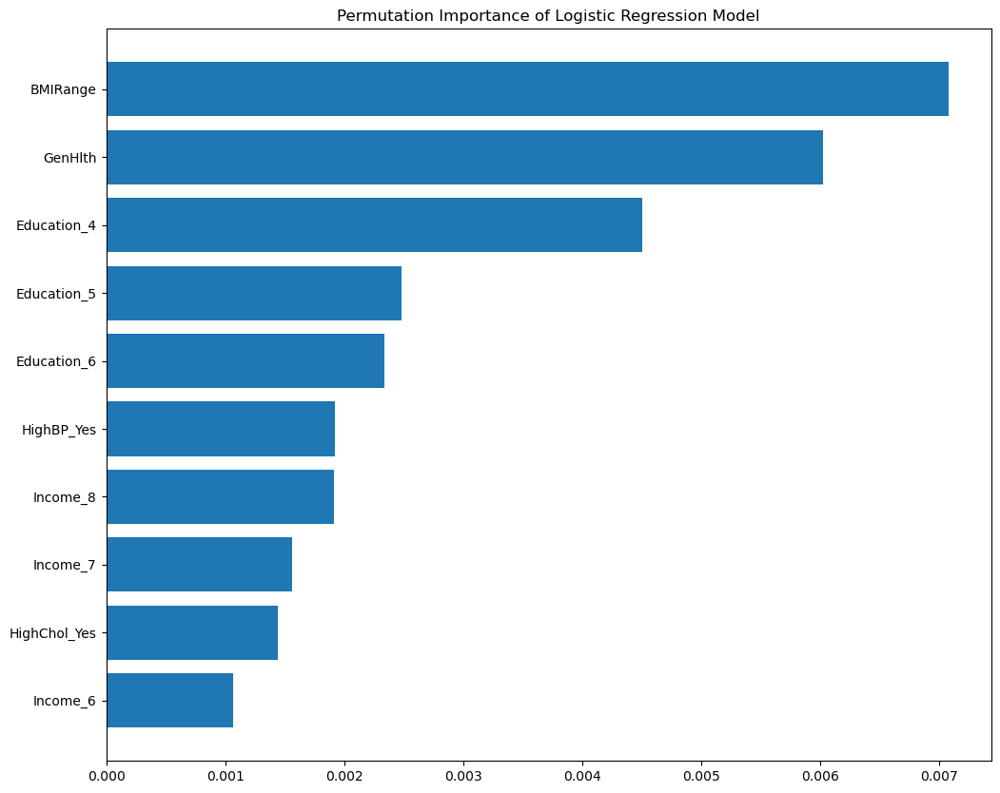

In [90]:
#Permutation importance of Linear Regression Model
ReturnPermutationImportance(lg_model,X_test, y_test, 20, "Logistic Regression Model")[0].show()

In [ ]:
#Permutation importance of KNN Model
ReturnPermutationImportance(knn_model,X_test.values, y_test.values, 20, "KNN Model")[0].show()

In [ ]:
#Permutation importance of Decision Tree Model
ReturnPermutationImportance(tree_model,X_test, y_test, 20, "Decision Tree Model")[0].show()

In [ ]:
#Permutation importance of SVM Model
ReturnPermutationImportance(svm_model,X_test, y_test, 20, "SVM Model")[0].show()

<b> Permutation Importance of KNN, Decision Trees and SVM are not completing even after running for multiple hours.</b>
<br><br>
<b>BMI</b> and <b>General health</b> are the two most important features in the prediction of diabetes followed by <b> High blood pressure </b> and <b> High Cholesterol</b> from the bio-markers side.